In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2 # https://stackoverflow.com/questions/5364050/reloading-submodules-in-ipython

### Importing required packages
We are using pytorch because of it's efficiency in image captioning and natural language processing

In [1]:
from __future__ import print_function
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  1.0.1.post2
Torchvision Version:  0.2.1


### Dataset description
- We are going to use the COCO (Common Objects in Context) dataset for training the model.
- COCO is a commonly used dataset for such tasks since one of the target family for COCO is captions.
- Every image comes with 5 different captions produced by different humans, hence every caption is slightly (sometimes greatly) different from the other captions for the same image.
- Under both Images and Annotations, the ratio of the train, validation and test data are given as follows - Training Data 83K/13GB Validation Data 41K/6GB Test Data 41K/GB

### Transforming Input Images
- We need to perform preprocessing or transformation – pixel values must be in the range [0,1] and we must then normalize the image by the mean and standard deviation of the ImageNet images' RGB channels.
- mean = [0.485, 0.456, 0.406] std = [0.229, 0.224, 0.225]
- Also, PyTorch follows the NCHW convention, which means the channels dimension (C) must precede the size dimensions.
- We will resize all MSCOCO images to 256x256 for uniformity.
- Images fed to the model must be a Float tensor of dimension N, 3, 256, 256, and must be normalized by the aforesaid mean and standard deviation. N is the batch size

In [312]:
# Top level data directory. Here we assume the format of the directory conforms 
#   to the ImageFolder structure

# Models to choose from [resnet, alexnet, vgg, squeezenet, densenet, inception]
model_name = "resnet"

# Number of classes in the dataset
num_classes = 10

# Batch size for training (change depending on how much memory you have)
batch_size = 5

# Number of epochs to train for 
num_epochs = 5

# Flag for feature extracting. When False, we finetune the whole model, 
#   when True we only update the reshaped layer params
feature_extract = True 

### Data Loading -
- Here we define the standard batch size of 32 for effective loading and traversing of 44000 images. We have created a get_loader() function which takes input as transformed train dataset, batch_size, vocab-threshold and vocab_file
- vocab_from_file consists of boolean to reference if we want to take words stored inside voacbulary.pkl file

In [317]:
input_size = 224

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(input_size),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

train1 = torchvision.datasets.CIFAR10(root='./data/train',train=True,download=True,transform=data_transforms['train'])

val1 = torchvision.datasets.CIFAR10(root='./data/val',train=False,download=True,transform=data_transforms['val'])

class_names = ['airplane','automobile','bird','cat','deer','dog','frog','horse', 'ship','truck']
print(class_names[1])

Files already downloaded and verified
Files already downloaded and verified
automobile


In [314]:
def unpickle(file):
    import pickle
    with open(file, 'rb') as fo:
        dict = pickle.load(fo, encoding='bytes')
    return dict

class_names=unpickle("/home/team3/576main/576/data/train/cifar-10-batches-py/batches.meta")

In [315]:
# Data augmentation and normalization for training
# Just normalization for validation
#input_size = 224

print("Initializing Datasets and Dataloaders...")

#data_dir = '/home/team3/576main/576/data'

# Create training and validation datasets
#image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
# Create training and validation dataloaders
dataloaders_dict = {"train": torch.utils.data.DataLoader(train1, batch_size=batch_size, shuffle=True, num_workers=5)}

dataloaders_dict['val'] = torch.utils.data.DataLoader(val1, batch_size=batch_size, shuffle=True, num_workers=5)


# Detect if we have a GPU available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

Initializing Datasets and Dataloaders...
cuda:0


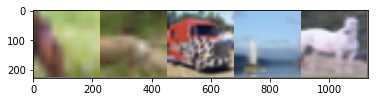

 deer  deer truck  ship horse


In [319]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs = iter(dataloaders_dict["train"])
images, labels = inputs.next()

# Make a grid from batch
imshow(torchvision.utils.make_grid(images))
print(' '.join('%5s' % class_names[labels[j]] for j in range(5)))

### Training the Model
- The task of image captioning can be divided into two modules logically – "one is an image based model"(Encoder) – which extracts the features and nuances out of our image, and the other is a "language based model"(Decoder) – which translates the features and objects given by our image based model to a natural sentence.
- Hence, we can map our data from the image space into some hidden space(Encoder) and then map that hidden space into the sentence space(Decoder)

#### Encoder -
- The Encoder encodes the input image with 3 color channels into a smaller image with "learned" channels.
- This smaller encoded image is a summary representation of all that's useful in the original image.
- Since we want to encode images, we use Convolutional Neural Networks (CNNs).
- Here we are not training the images from scratch, but instead using the concept of transfer learning. There are already many CNN's trained to capture to capture the essence of the iamge very well
- We have chosen to use the 50 layered Residual Network trained on ImageNet classification task, already available in Pytorch

#### Decoder -
- For decoder we rely on Recurrent Neural Network,job is to look at the encoded image and generate a caption word by word.
- Since it's generating a sequence, we are using LSTM (RNN network)
- We are using RNN without attention model, where we are simply averaging the encoded image across all pixels.
- We feed this with linear transformation into the Decoder and it generates its first hidden state and generate the caption. Each predicted word is used to generate the next word.

In [320]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False):
    since = time.time()

    val_acc_history = []
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_acc_history.append(epoch_acc)

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history

In [321]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [322]:
# Parameters of newly constructed modules have requires_grad=True by default

def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0
    
    if model_name == "resnet":
        """ Resnet18
        """
        model_ft = models.resnet18(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224
    else:
        print("Invalid model name, exiting...")
        exit()
    
    return model_ft, input_size

# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=True)

# Print the model we just instantiated
print(model_ft)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Co

In [323]:
# Feature Extract and update model
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are 
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9)

Params to learn:
	 fc.weight
	 fc.bias


#### Loss function -
- Since we're generating a sequence of words, we use CrossEntropyLoss. We need to submit the raw scores from the final layer in the Decoder, and the loss function will perform the operations.
- In terms of optimizer, we have used Adam optimizer algorithm to update the network weights iteratively based on training data

In [324]:
# Feature Extract and update model
# Setup the loss fxn
criterion = nn.CrossEntropyLoss()
# Train and evaluate
model_fe, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs=num_epochs, is_inception=(model_name=="inception"))

Epoch 0/4
----------
train Loss: 1.6228 Acc: 0.4476
val Loss: 0.8670 Acc: 0.7091

Epoch 1/4
----------
train Loss: 1.5712 Acc: 0.4745
val Loss: 1.0179 Acc: 0.6746

Epoch 2/4
----------
train Loss: 1.5705 Acc: 0.4809
val Loss: 0.9434 Acc: 0.6961

Epoch 3/4
----------
train Loss: 1.5607 Acc: 0.4814
val Loss: 0.8584 Acc: 0.7164

Epoch 4/4
----------
train Loss: 1.5784 Acc: 0.4785
val Loss: 0.7954 Acc: 0.7277

Training complete in 6m 9s
Best val Acc: 0.727700


### Training
- Notice that, even though we have two model components, i.e. encoder and decoder, we train them jointly by passing the output of the encoder, which is the latent space vector, to the decoder, which, in turn, is the recurrent neural network.
- We trained the model on GeForce GTX 1080 with batch size of 32 for 2 epoch, which took around 2 hours. After 1 epochs the results of the model were already pretty good, signifying the convergence of the model

In [96]:
# Finetuning the model
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are 
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9)

Params to learn:
	 conv1.weight
	 bn1.weight
	 bn1.bias
	 layer1.0.conv1.weight
	 layer1.0.bn1.weight
	 layer1.0.bn1.bias
	 layer1.0.conv2.weight
	 layer1.0.bn2.weight
	 layer1.0.bn2.bias
	 layer1.1.conv1.weight
	 layer1.1.bn1.weight
	 layer1.1.bn1.bias
	 layer1.1.conv2.weight
	 layer1.1.bn2.weight
	 layer1.1.bn2.bias
	 layer2.0.conv1.weight
	 layer2.0.bn1.weight
	 layer2.0.bn1.bias
	 layer2.0.conv2.weight
	 layer2.0.bn2.weight
	 layer2.0.bn2.bias
	 layer2.0.downsample.0.weight
	 layer2.0.downsample.1.weight
	 layer2.0.downsample.1.bias
	 layer2.1.conv1.weight
	 layer2.1.bn1.weight
	 layer2.1.bn1.bias
	 layer2.1.conv2.weight
	 layer2.1.bn2.weight
	 layer2.1.bn2.bias
	 layer3.0.conv1.weight
	 layer3.0.bn1.weight
	 layer3.0.bn1.bias
	 layer3.0.conv2.weight
	 layer3.0.bn2.weight
	 layer3.0.bn2.bias
	 layer3.0.downsample.0.weight
	 layer3.0.downsample.1.weight
	 layer3.0.downsample.1.bias
	 layer3.1.conv1.weight
	 layer3.1.bn1.weight
	 layer3.1.bn1.bias
	 layer3.1.conv2.weight
	 layer3.1.b

In [97]:
# Finetuning the model
# Setup the loss fxn
criterion = nn.CrossEntropyLoss()
# Train and evaluate
model_ft, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs=num_epochs, is_inception=(model_name=="inception"))

Epoch 0/4
----------
train Loss: 1.3104 Acc: 0.5628
val Loss: 0.4436 Acc: 0.8576

Epoch 1/4
----------
train Loss: 0.9921 Acc: 0.6695
val Loss: 0.4872 Acc: 0.8491

Epoch 2/4
----------
train Loss: 0.8860 Acc: 0.7066
val Loss: 0.3274 Acc: 0.8919

Epoch 3/4
----------
train Loss: 0.8127 Acc: 0.7305
val Loss: 0.3913 Acc: 0.8823

Epoch 4/4
----------
train Loss: 0.7668 Acc: 0.7417
val Loss: 0.3731 Acc: 0.8811

Training complete in 18m 52s
Best val Acc: 0.891900


In [ ]:
def Top_Correct(model, num_images=25,out=1):
    images_so_far = 0
    fig = plt.figure()

    for b in range(1000): 
        data = next(iter(dataloaders_dict['val']))
        inputs, labels = data
        inputs, labels = inputs.cuda(), labels.cuda()

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)
        b += 1
        for a in range(5):
            if preds[a] == out:
            
                #ax = plt.subplot(num_images//2, num_images//2, a)
                #ax.axis('off')
                #ax.set_title('predicted: {}'.format(class_names[preds[a]]))
                print('predicted: {}'.format(class_names[preds[a]]))
                imshow(torchvision.utils.make_grid(inputs.cpu().data[a]))
                images_so_far += 1

            if images_so_far == num_images:
                    return  
                
def Top_Incorrect(model, num_images=25,out=1):
    images_so_far = 0
    fig = plt.figure()

    for b in range(1000): 
        data = next(iter(dataloaders_dict['val']))
        inputs, labels = data
        inputs, labels = inputs.cuda(), labels.cuda()

        outputs = model(inputs)
        _, preds = torch.min(outputs.data, 1)
        b += 1
        for a in range(5):
            if preds[a] == out:
            
                #ax = plt.subplot(num_images//2, num_images//2, a)
                #ax.axis('off')
                #ax.set_title('predicted: {}'.format(class_names[preds[a]]))
                print('predicted: {}'.format(class_names[preds[a]]))
                imshow(torchvision.utils.make_grid(inputs.cpu().data[a]))
                images_so_far += 1

            if images_so_far == num_images:
                    return                         

#### Text answer

Top correct predictions for class: airplane
predicted: airplane


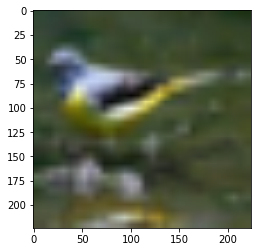

predicted: airplane


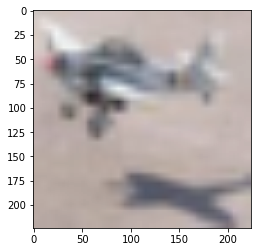

predicted: airplane


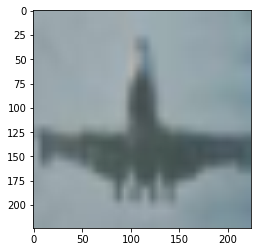

predicted: airplane


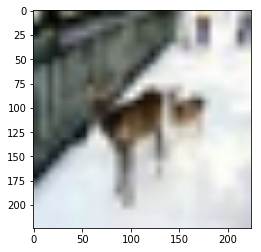

predicted: airplane


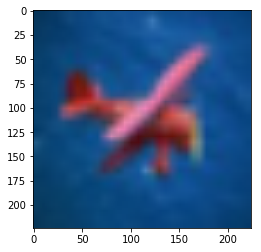

Top Incorrect predictions for class: airplane
predicted: airplane


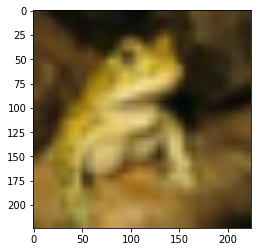

predicted: airplane


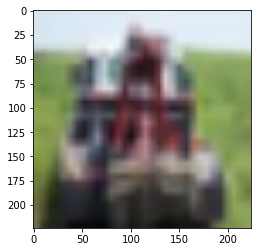

predicted: airplane


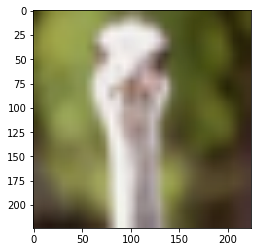

predicted: airplane


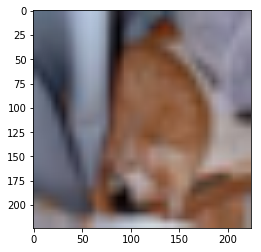

predicted: airplane


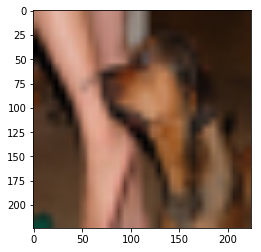

Top correct predictions for class: automobile
predicted: automobile


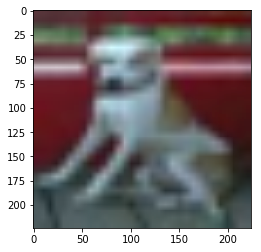

predicted: automobile


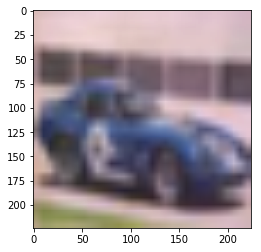

predicted: automobile


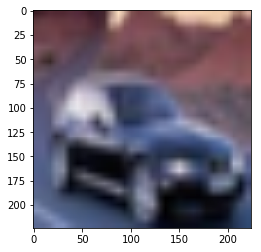

predicted: automobile


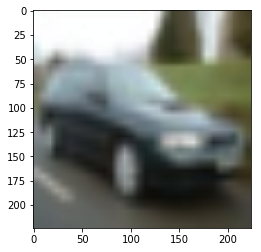

predicted: automobile


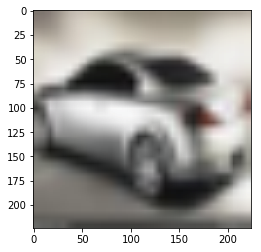

Top Incorrect predictions for class: automobile
predicted: automobile


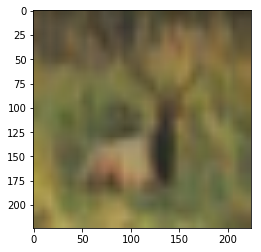

predicted: automobile


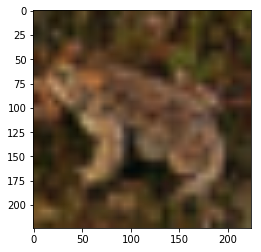

predicted: automobile


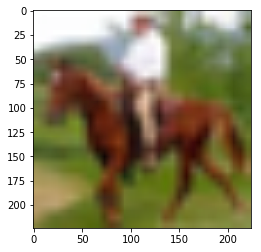

predicted: automobile


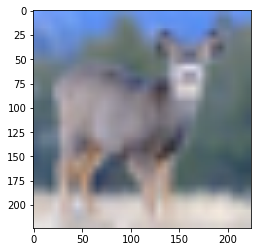

predicted: automobile


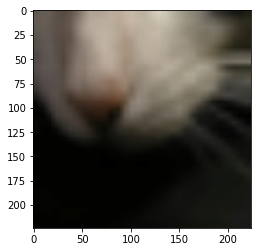

Top correct predictions for class: bird
predicted: bird


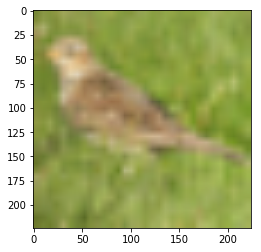

predicted: bird


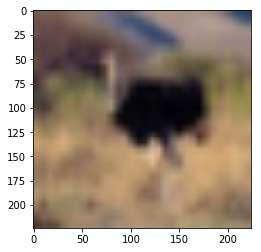

predicted: bird


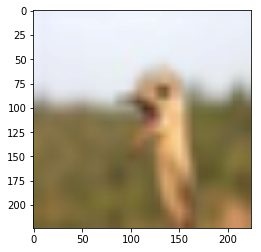

predicted: bird


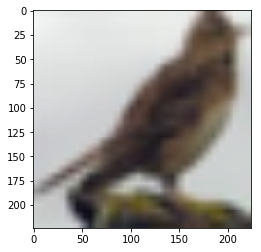

predicted: bird


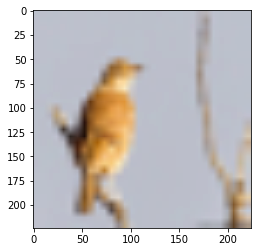

Top Incorrect predictions for class: bird
predicted: bird


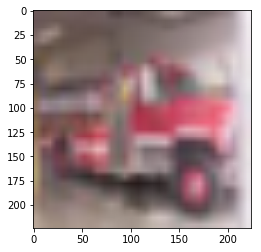

predicted: bird


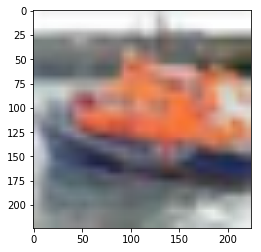

predicted: bird


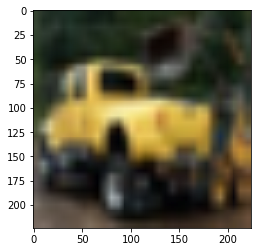

predicted: bird


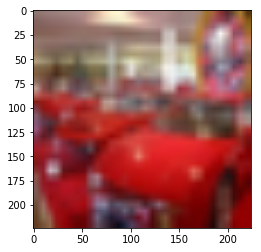

predicted: bird


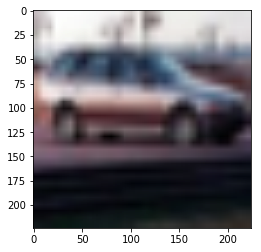

Top correct predictions for class: cat
predicted: cat


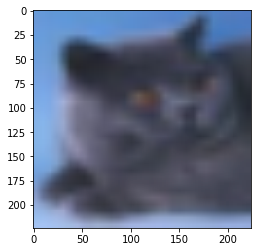

predicted: cat


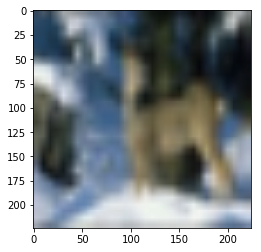

predicted: cat


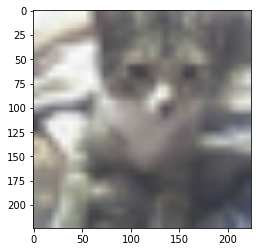

predicted: cat


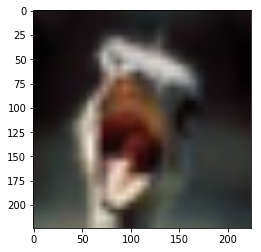

predicted: cat


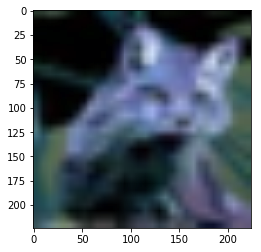

Top Incorrect predictions for class: cat
predicted: cat


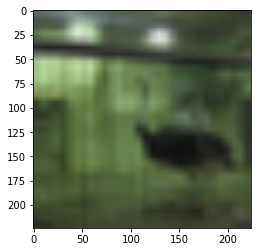

predicted: cat


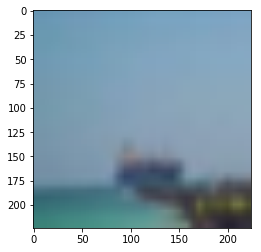

predicted: cat


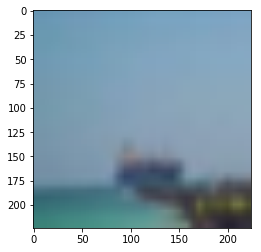

predicted: cat


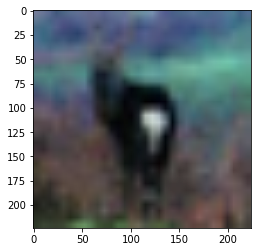

predicted: cat


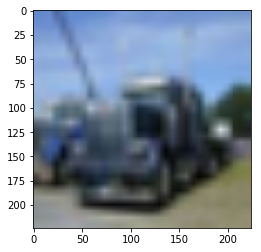

Top correct predictions for class: deer
predicted: deer


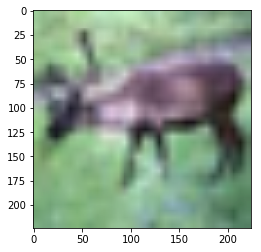

predicted: deer


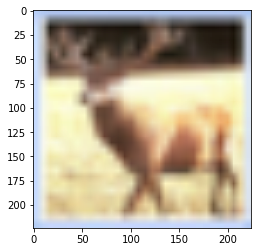

predicted: deer


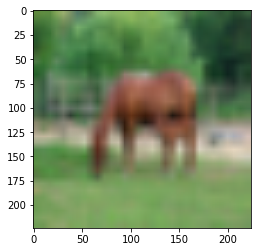

predicted: deer


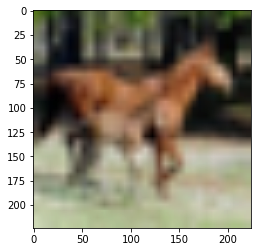

predicted: deer


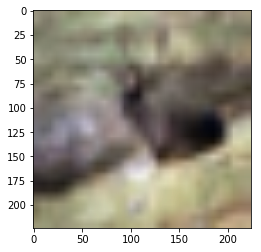

Top Incorrect predictions for class: deer
predicted: deer


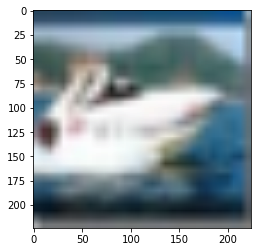

predicted: deer


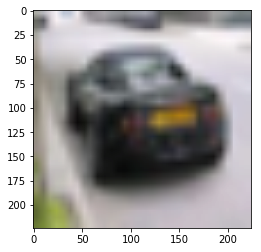

predicted: deer


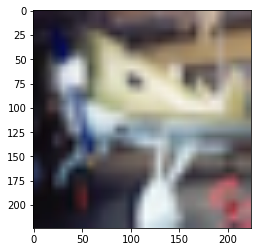

predicted: deer


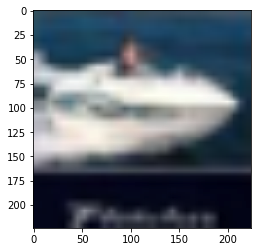

predicted: deer


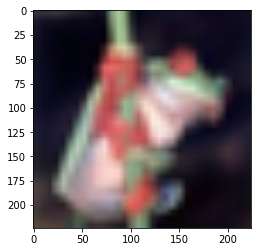

Top correct predictions for class: dog
predicted: dog


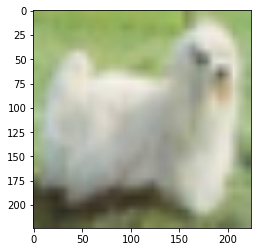

predicted: dog


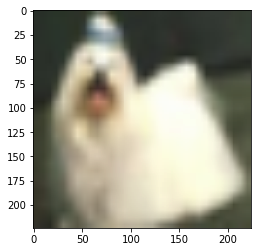

predicted: dog


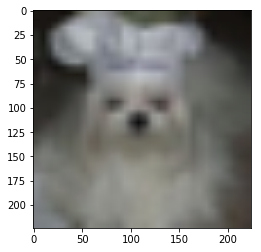

predicted: dog


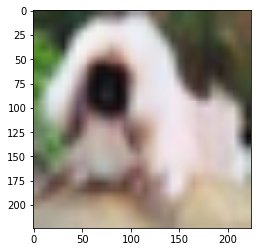

predicted: dog


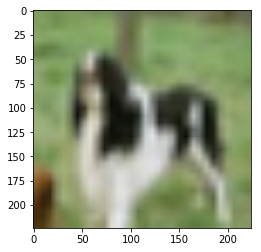

Top Incorrect predictions for class: dog
predicted: dog


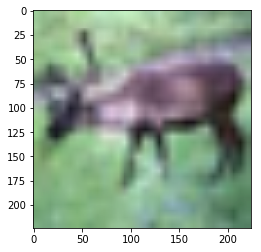

predicted: dog


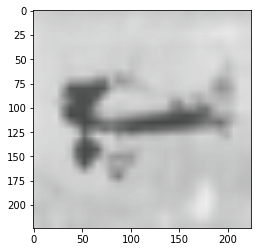

predicted: dog


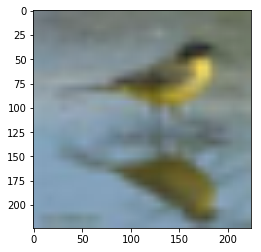

predicted: dog


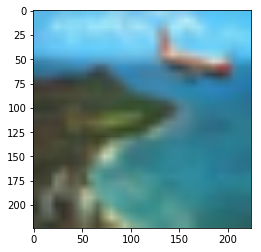

predicted: dog


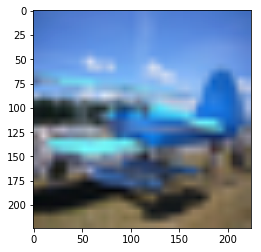

Top correct predictions for class: frog
predicted: frog


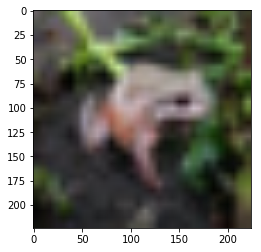

predicted: frog


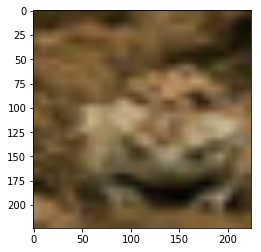

predicted: frog


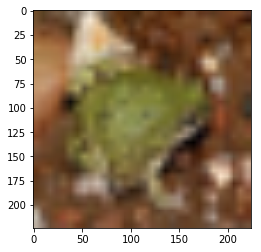

predicted: frog


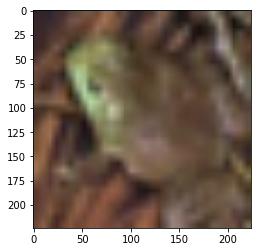

predicted: frog


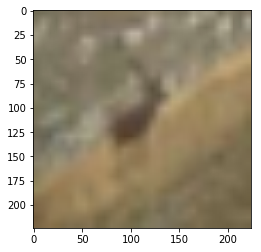

Top Incorrect predictions for class: frog
predicted: frog


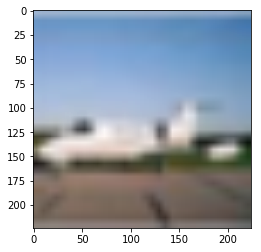

predicted: frog


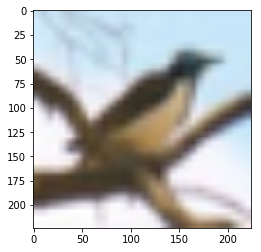

predicted: frog


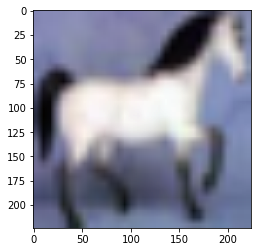

predicted: frog


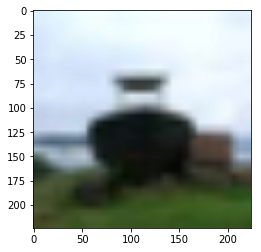

predicted: frog


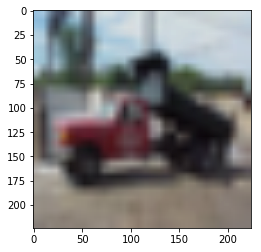

Top correct predictions for class: horse
predicted: horse


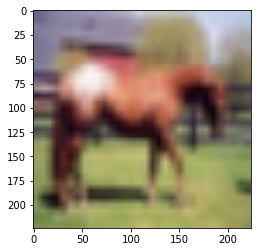

predicted: horse


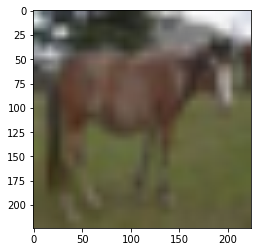

predicted: horse


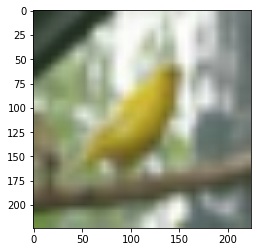

predicted: horse


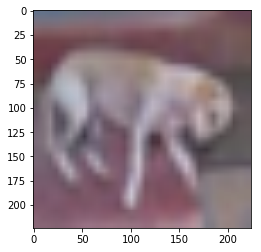

predicted: horse


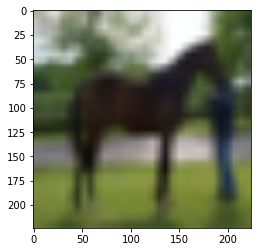

Top Incorrect predictions for class: horse
predicted: horse


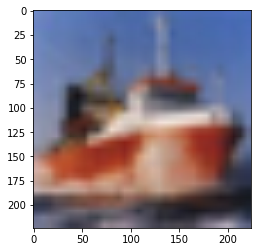

predicted: horse


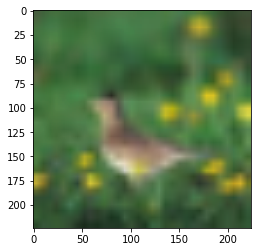

predicted: horse


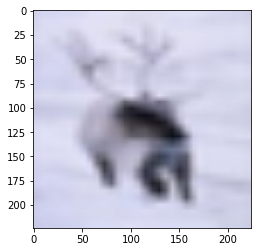

predicted: horse


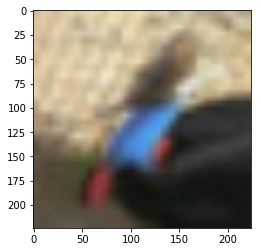

predicted: horse


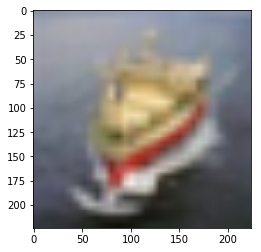

Top correct predictions for class: ship
predicted: ship


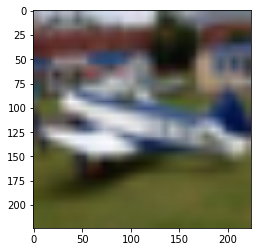

predicted: ship


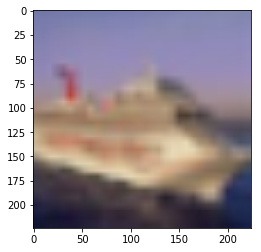

predicted: ship


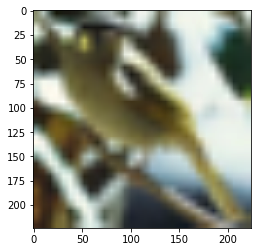

predicted: ship


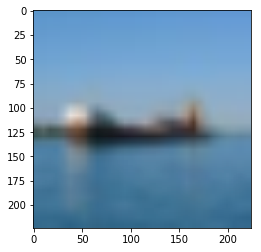

predicted: ship


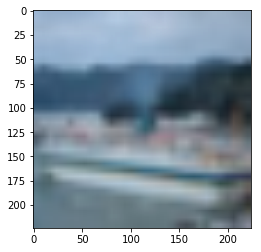

Top Incorrect predictions for class: ship
predicted: ship


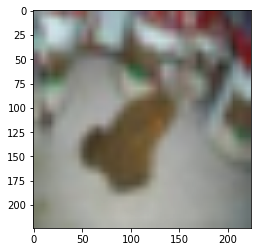

predicted: ship


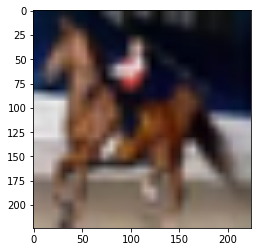

predicted: ship


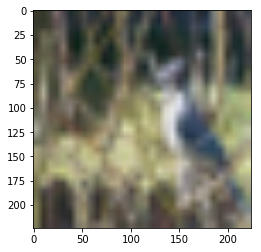

predicted: ship


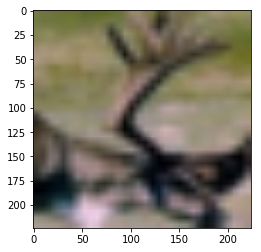

predicted: ship


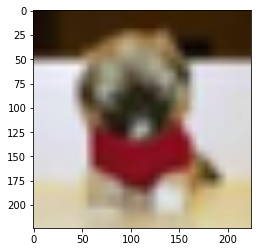

Top correct predictions for class: truck
predicted: truck


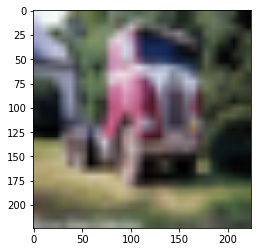

predicted: truck


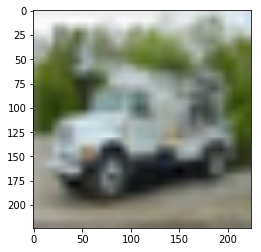

predicted: truck


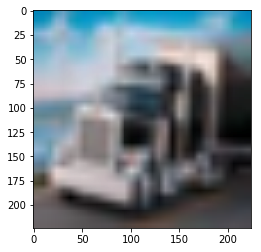

predicted: truck


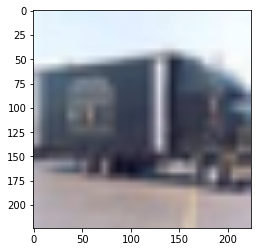

predicted: truck


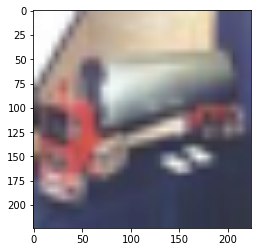

Top Incorrect predictions for class: truck
predicted: truck


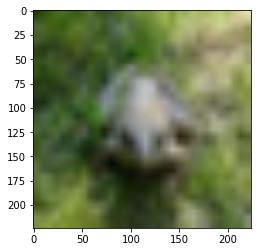

predicted: truck


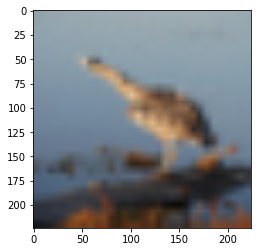

predicted: truck


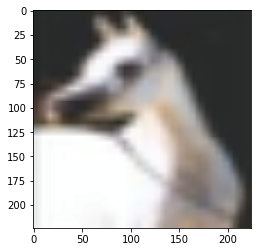

predicted: truck


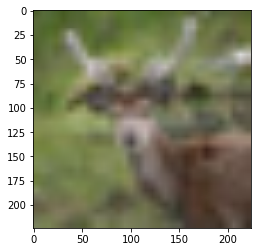

predicted: truck


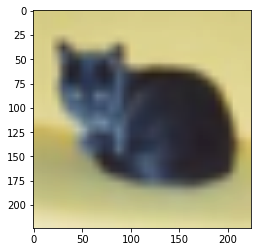

In [325]:
# Feature Extract model results: Top 5 correct and incorrect predictions per class
for i in range(10):
    print('Top correct predictions for class: {}'.format(class_names[i]))
    Top_Correct(model_fe,num_images=5,out=i)
    print('Top Incorrect predictions for class: {}'.format(class_names[i]))
    Top_Incorrect(model_fe,num_images=5,out=i)

Top correct predictions for class: airplane
predicted: airplane


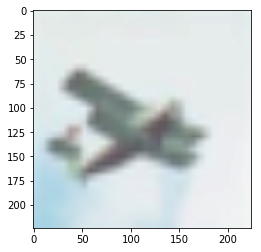

predicted: airplane


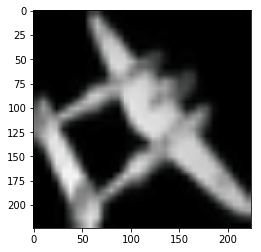

predicted: airplane


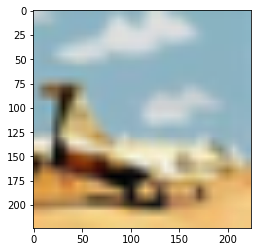

predicted: airplane


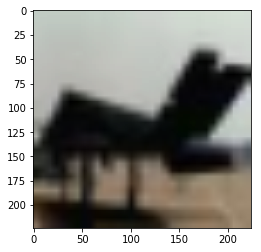

predicted: airplane


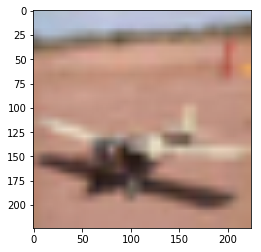

Top Incorrect predictions for class: airplane
predicted: airplane


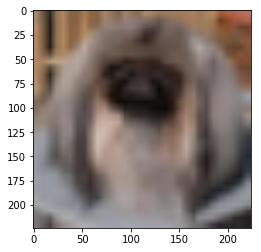

predicted: airplane


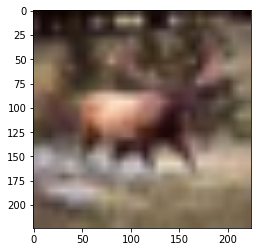

predicted: airplane


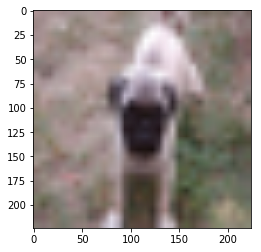

predicted: airplane


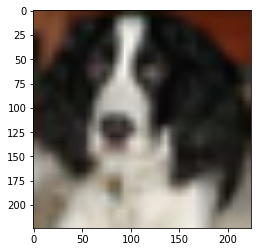

predicted: airplane


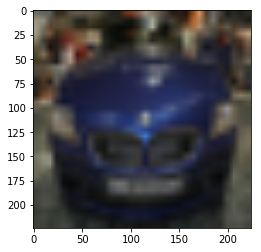

Top correct predictions for class: automobile
predicted: automobile


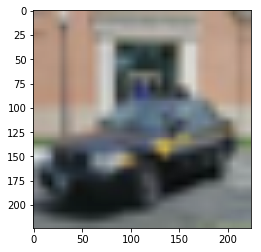

predicted: automobile


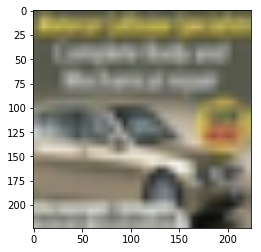

predicted: automobile


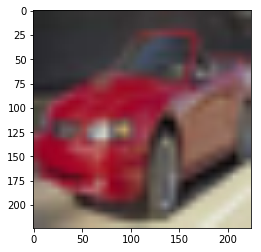

predicted: automobile


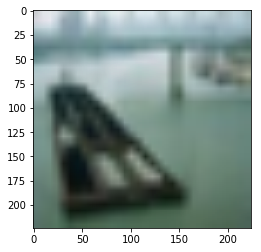

predicted: automobile


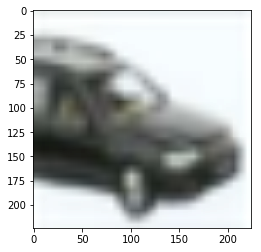

Top Incorrect predictions for class: automobile
predicted: automobile


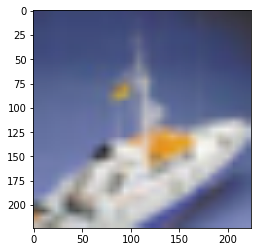

predicted: automobile


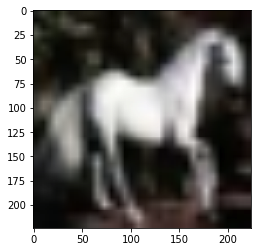

predicted: automobile


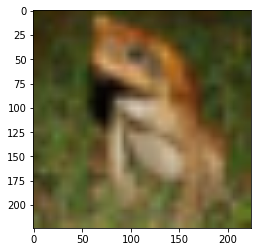

predicted: automobile


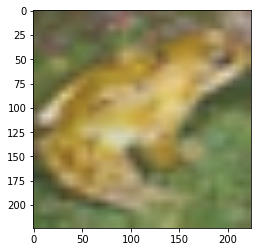

predicted: automobile


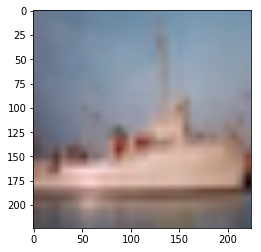

Top correct predictions for class: bird
predicted: bird


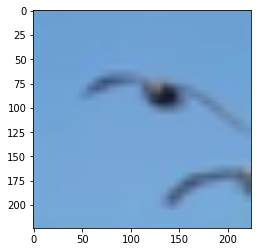

predicted: bird


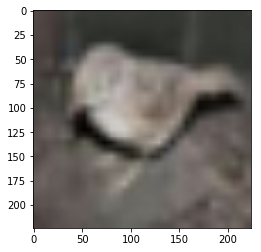

predicted: bird


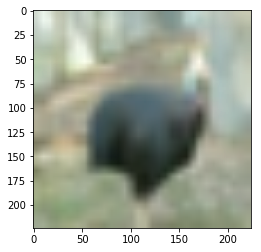

predicted: bird


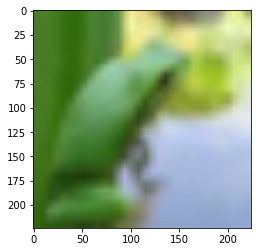

predicted: bird


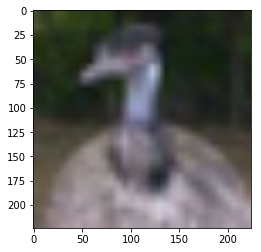

Top Incorrect predictions for class: bird
predicted: bird


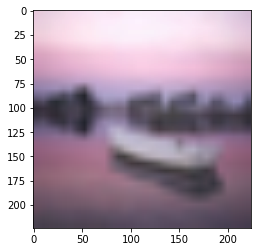

predicted: bird


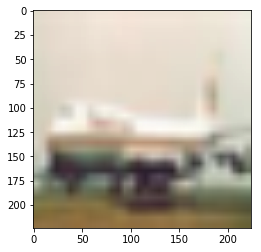

predicted: bird


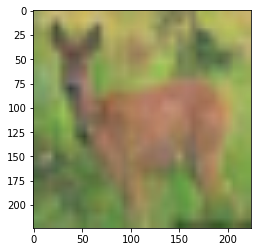

predicted: bird


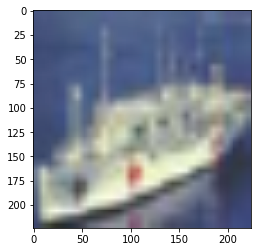

predicted: bird


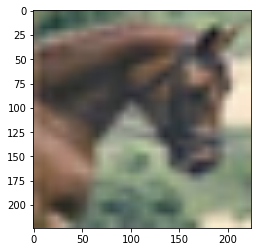

Top correct predictions for class: cat
predicted: cat


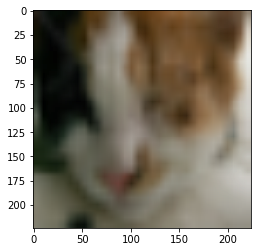

predicted: cat


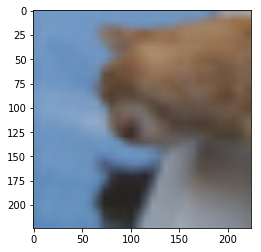

predicted: cat


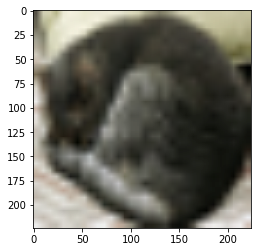

predicted: cat


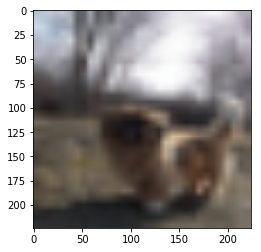

predicted: cat


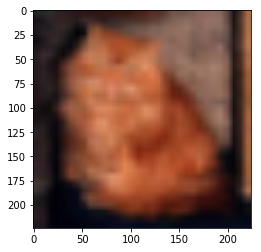

Top Incorrect predictions for class: cat
predicted: cat


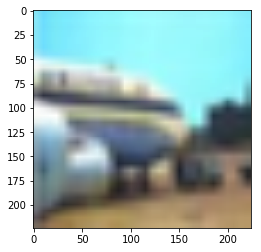

predicted: cat


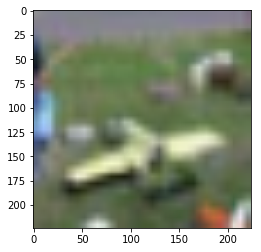

predicted: cat


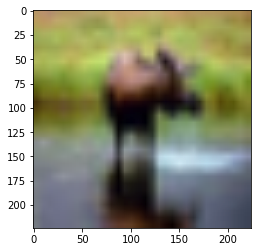

predicted: cat


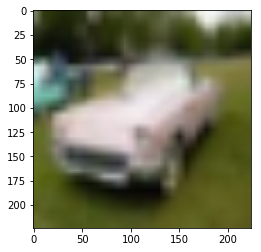

predicted: cat


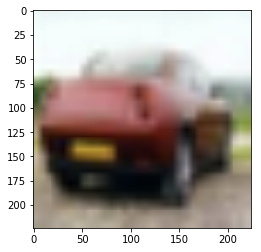

Top correct predictions for class: deer
predicted: deer


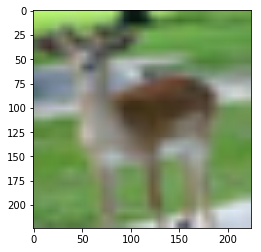

predicted: deer


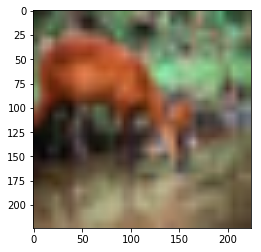

predicted: deer


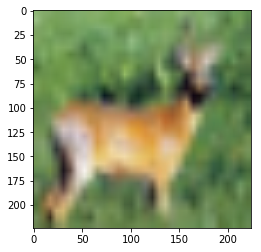

predicted: deer


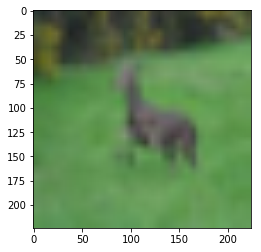

predicted: deer


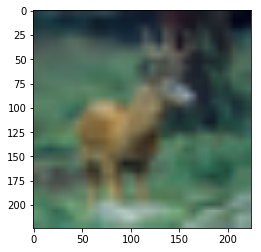

Top Incorrect predictions for class: deer
predicted: deer


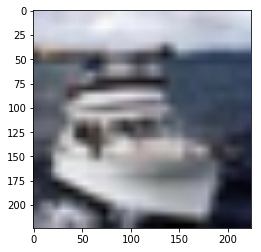

predicted: deer


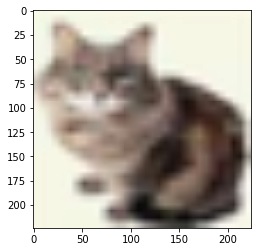

predicted: deer


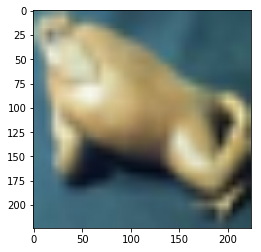

predicted: deer


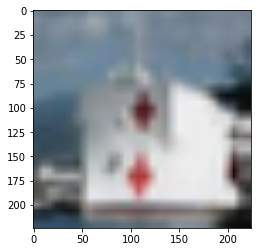

predicted: deer


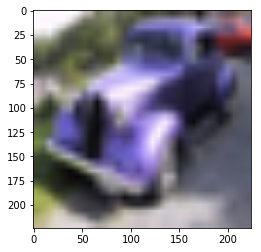

Top correct predictions for class: dog
predicted: dog


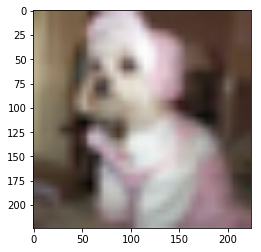

predicted: dog


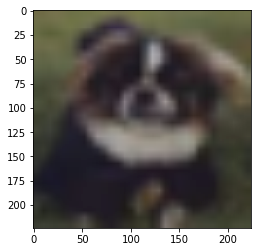

predicted: dog


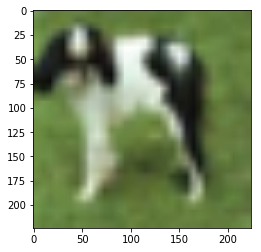

predicted: dog


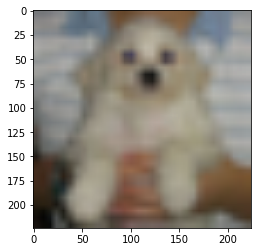

predicted: dog


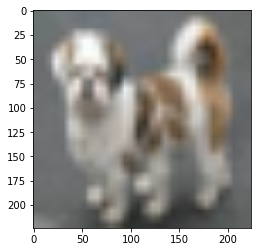

Top Incorrect predictions for class: dog
predicted: dog


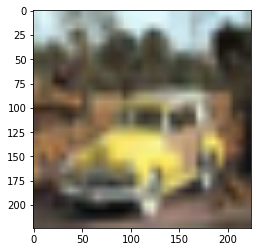

predicted: dog


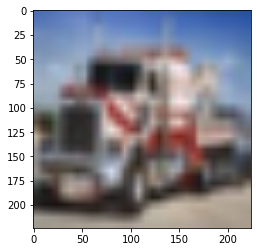

predicted: dog


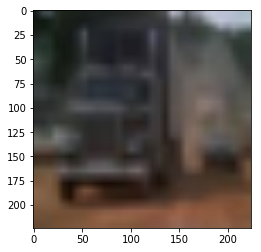

predicted: dog


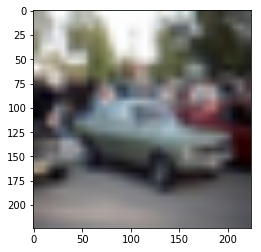

predicted: dog


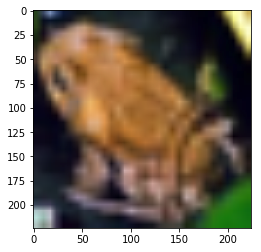

Top correct predictions for class: frog
predicted: frog


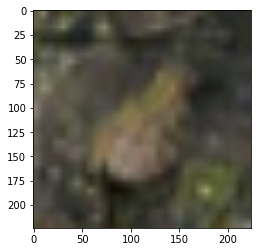

predicted: frog


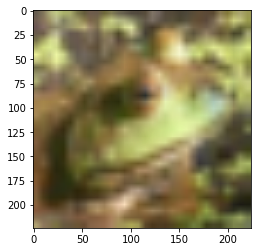

predicted: frog


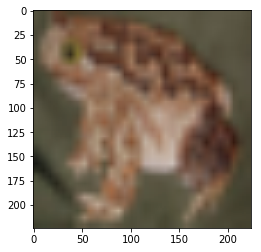

predicted: frog


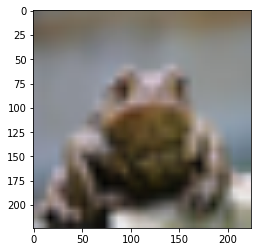

predicted: frog


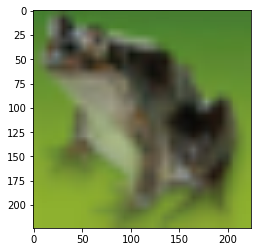

Top Incorrect predictions for class: frog
predicted: frog


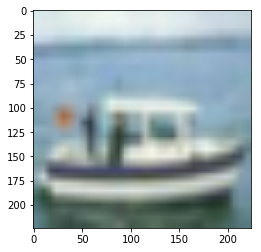

predicted: frog


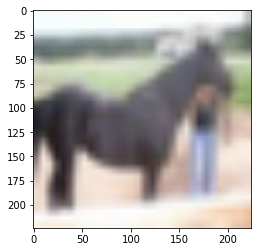

predicted: frog


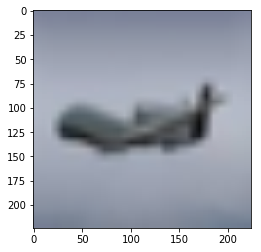

predicted: frog


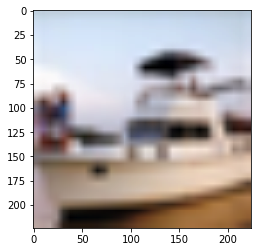

predicted: frog


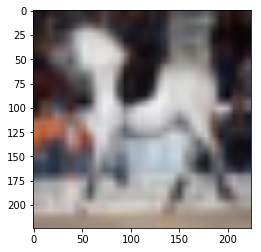

Top correct predictions for class: horse
predicted: horse


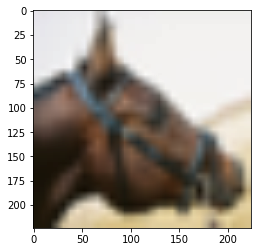

predicted: horse


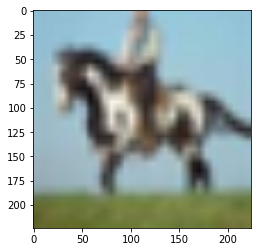

predicted: horse


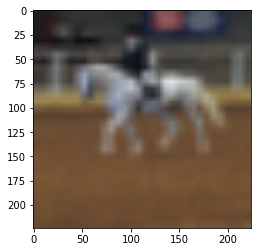

predicted: horse


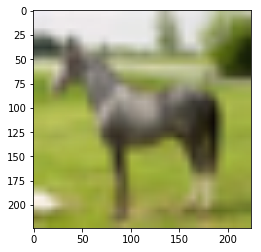

predicted: horse


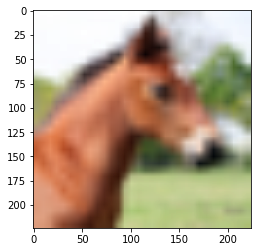

Top Incorrect predictions for class: horse
predicted: horse


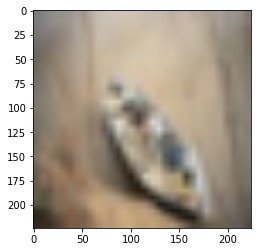

predicted: horse


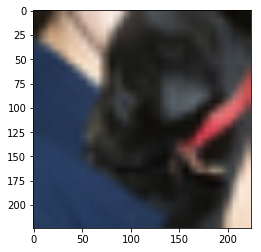

predicted: horse


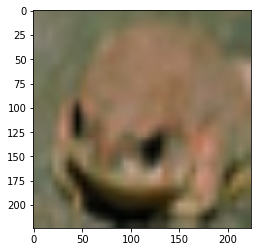

predicted: horse


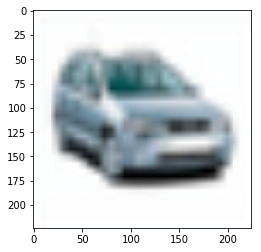

predicted: horse


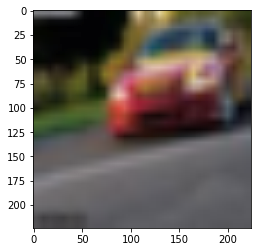

Top correct predictions for class: ship
predicted: ship


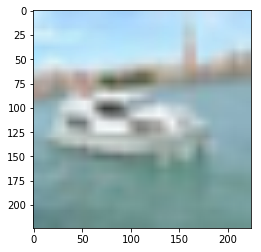

predicted: ship


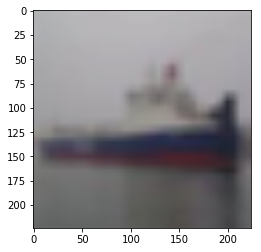

predicted: ship


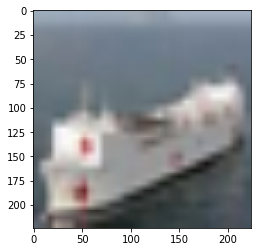

predicted: ship


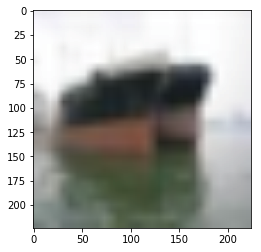

predicted: ship


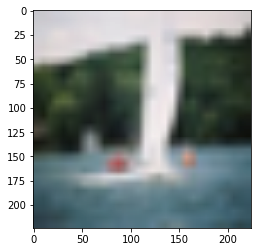

Top Incorrect predictions for class: ship
predicted: ship


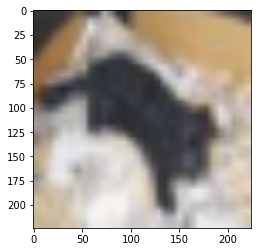

predicted: ship


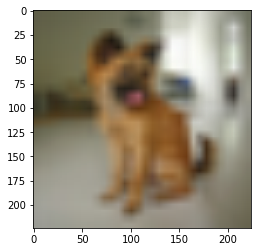

predicted: ship


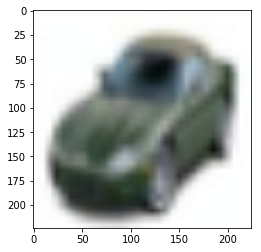

predicted: ship


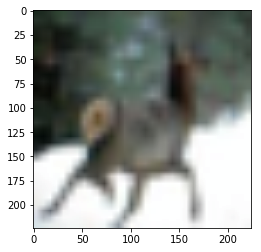

predicted: ship


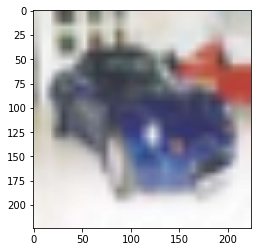

Top correct predictions for class: truck
predicted: truck


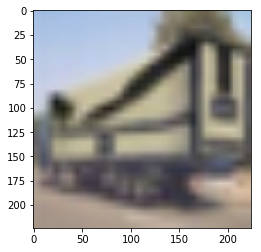

predicted: truck


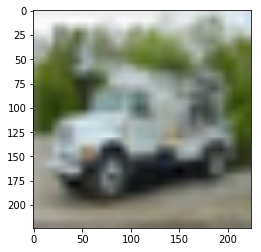

predicted: truck


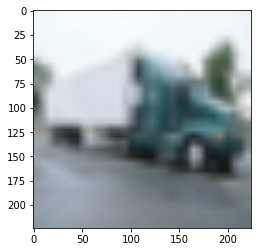

predicted: truck


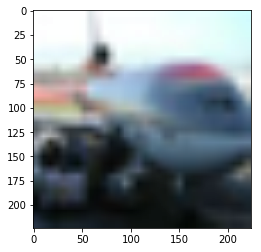

predicted: truck


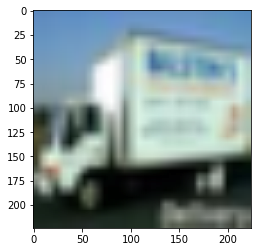

Top Incorrect predictions for class: truck
predicted: truck


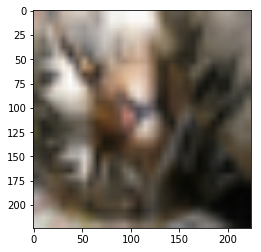

predicted: truck


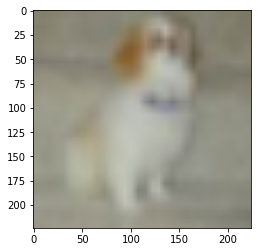

predicted: truck


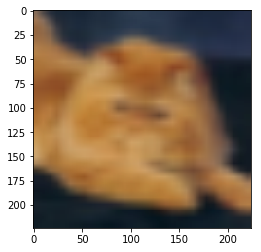

predicted: truck


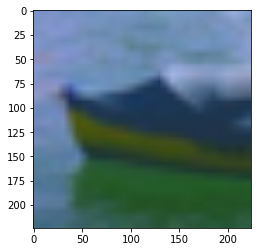

predicted: truck


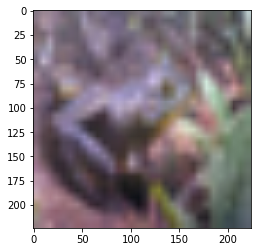

In [311]:
# Finetuning model results: Top 5 correct and incorrect predictions per class
for i in range(10):
    print('Top correct predictions for class: {}'.format(class_names[i]))
    Top_Correct(model_ft,num_images=5,out=i)
    print('Top Incorrect predictions for class: {}'.format(class_names[i]))
    Top_Incorrect(model_ft,num_images=5,out=i)